<a href="https://colab.research.google.com/github/chetanvshah20/AddressBook/blob/main/FinalDeepLiningProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Marina Pier Inc. is leveraging technology to automate their operations on the San Francisco port.
The company’s management has set out to build a bias-free/ corruption-free automatic system that reports & avoids faulty situations caused by human error. Examples of human error include misclassifying the correct type of boat. The type of boat that enters the port region is as follows.
●	Buoy
●	Cruise_ship
●	Ferry_boat
●	Freight_boar
●	Gondola
●	Inflatable_boat
●	Kayak
●	Paper_boat
●	Sailboat
Marina Pier wants to use Deep Learning techniques to build an automatic reporting system that recognizes the boat. The company is also looking to use a transfer learning approach of any lightweight pre-trained model in order to deploy in mobile devices.
As a deep learning engineer, your task is to:
1.	Build a CNN network to classify the boat.
2.	Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning. You can use any lightweight pre-trained model as the initial (first) layer. MobileNetV2 is a popular lightweight pre-trained model built using Keras API.
Dataset and Data Description:
boat_type_classification_dataset.zip
The dataset contains images of 9 types of boats. It contains a total of 1162 images. The training images are provided in the directory of the specific class itself.
Classes:
●	ferry_boat
●	gondola
●	sailboat
●	cruise_ship
●	kayak
●	inflatable_boat
●	paper_boat
●	buoy
●	freight_boat
Perform the following steps:
1.	Build a CNN network to classify the boat.
1.1.	Split the dataset into train and test in the ratio 80:20, with shuffle and random state=43.
1.2.	Use Keras ImageDataGenerator to initialize the train generator with validation_split=0.2 and test generator. Generators are required to avoid out of memory issues while training.
1.3.	Both generators will be initialized with data normalization.
(Hint: rescale=1./255).
1.4.	Load train, validation and test dataset in batches of 32 using the generators initialized in the above step.
1.5.	Build a CNN network using Keras with the following layers
•	Cov2D with 32 filters, kernel size 3,3, and activation relu, followed by MaxPool2D
•	Cov2D with 32 filters, kernel size 3,3, and activation relu, followed by MaxPool2D
•	GLobalAveragePooling2D layer
•	Dense layer with 128 neurons and activation relu
•	Dense layer with 128 neurons and activation relu
•	Dense layer with 9 neurons and activation softmax.
1.6.	Compile the model with Adam optimizer, categorical_crossentropy loss, and with metrics accuracy, precision, and recall.
1.7.	Train the model for 20 epochs and plot training loss and accuracy against epochs.
1.8.	Evaluate the model on test images and print the test loss and accuracy.
1.9.	Plot heatmap of the confusion matrix and print classification report.
2.	Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning. You can use any lightweight pre-trained model as the initial (first) layer. MobileNetV2 is a popular lightweight pre-trained model built using Keras API.
2.1.	Split the dataset into train and test datasets in the ration 70:30, with shuffle and random state=1.
2.2.	Use Keras ImageDataGenerator to initialize the train generator with validation_split=0.2 and test generator. Generators are required to avoid out-of-memory issues while training.
2.3.	Both generators will be initialized with data normalization.
(Hint: rescale=1./255).
2.4.	Load train, validation and test datasets in batches of 32 using the generators initialized in the above step.
2.5.	Build a CNN network using Keras with the following layers.
•	Load MobileNetV2 - Light Model as the first layer
(Hint: Keras API Doc)
•	GLobalAveragePooling2D layer
•	Dropout(0.2)
•	Dense layer with 256 neurons and activation relu
•	BatchNormalization layer
•	Dropout(0.1)
•	Dense layer with 128 neurons and activation relu
•	BatchNormalization layer
•	Dropout(0.1)
•	Dense layer with 9 neurons and activation softmax
2.6.	Compile the model with Adam optimizer, categorical_crossentropy loss, and metrics accuracy, Precision, and Recall.
2.7.	Train the model for 50 epochs and Early stopping while monitoring validation loss.
2.8.	Evaluate the model on test images and print the test loss and accuracy.
2.9.	Plot Train loss Vs Validation loss and Train accuracy Vs Validation accuracy.
3.	Compare the results of both models built in steps 1 and 2 and state your observations.a


Install Required Package for Split Folder

In [15]:
pip install split-folders

Import Necessary Libraries

In [16]:
import os
import shutil
import splitfolders
import tensorflow as tf
from os import listdir
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, \
                    Dropout, BatchNormalization, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from keras.metrics import Recall, Precision
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, \
                            classification_report
import pandas as pd
import numpy as np
from sklearn.utils import class_weight
import warnings
warnings.simplefilter(action='ignore')
from PIL import Image
import cv2
import pathlib
import tensorflow_hub as hub
from tensorflow import keras

Get Total Count of Images

In [17]:
images_dirs = pathlib.Path('AutoPort/')
image_count = len(list(images_dirs.glob('*/*.jpg')))
print(image_count)

1162


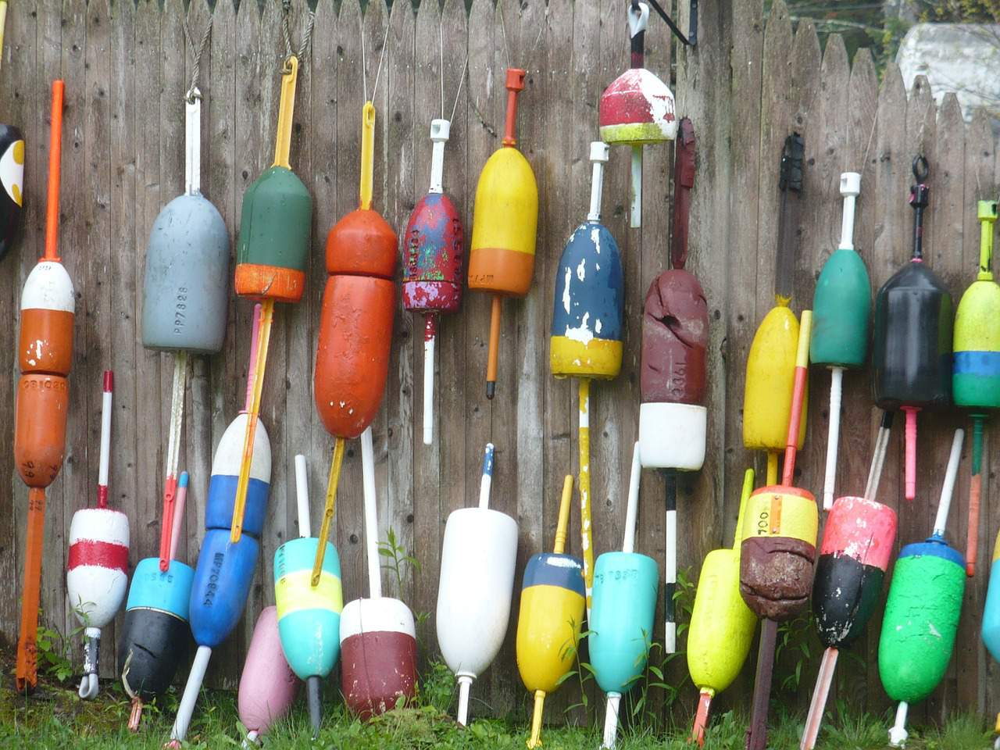

In [18]:
buoy = list(images_dirs.glob('buoy/*'))
Image.open(str(buoy[10]))

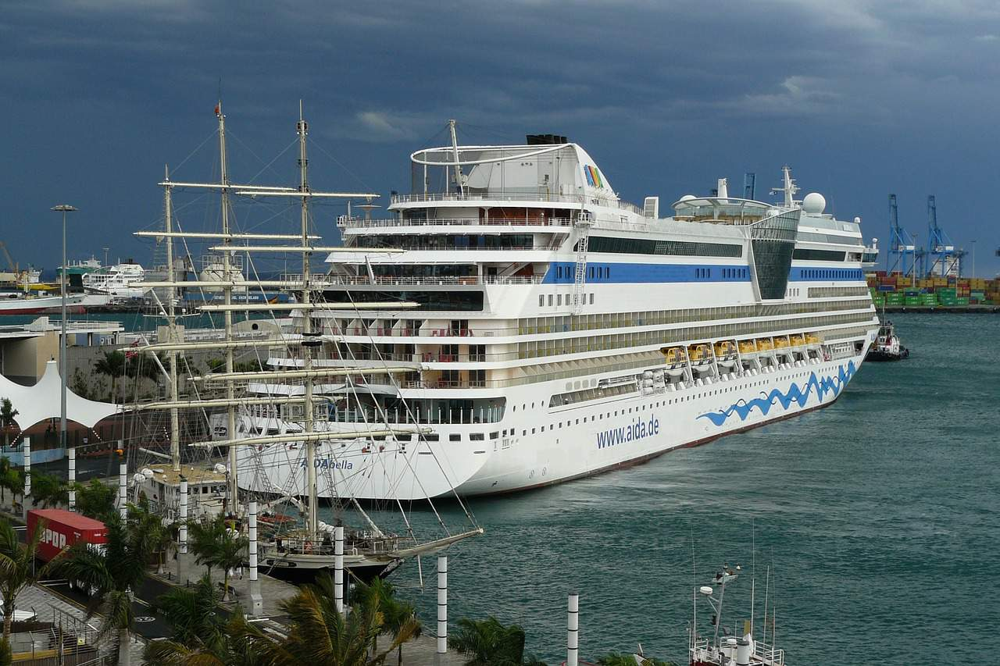

In [19]:
cruise_ship = list(images_dirs.glob('cruise_ship/*'))
Image.open(str(cruise_ship[10]))

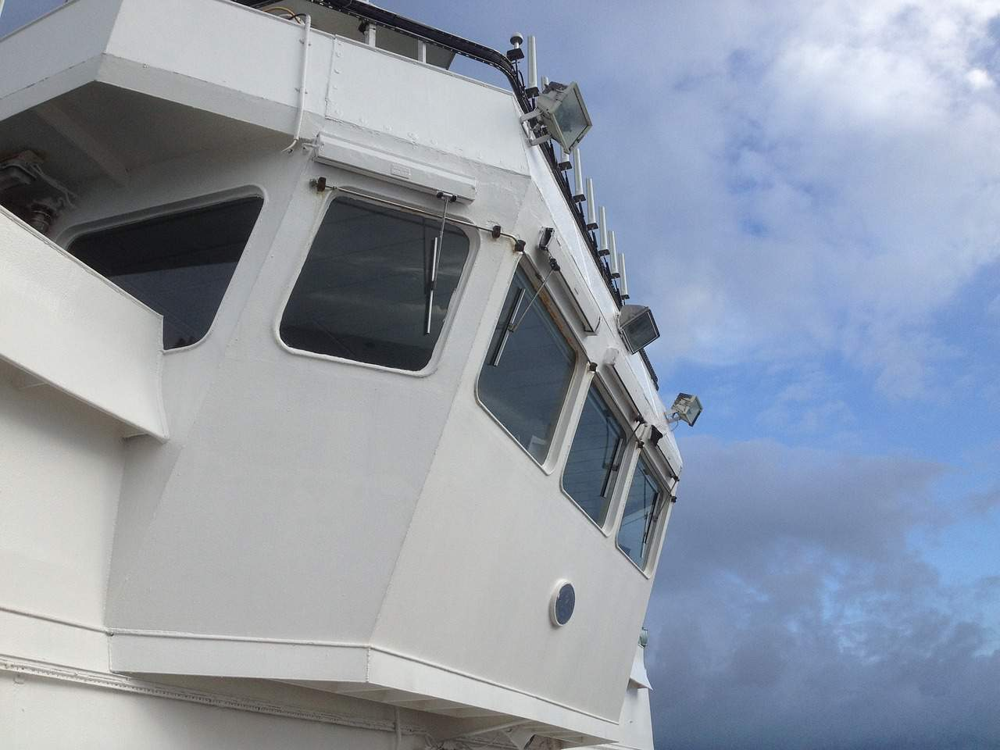

In [20]:
ferry_boat = list(images_dirs.glob('ferry_boat/*'))
Image.open(str(ferry_boat[10]))

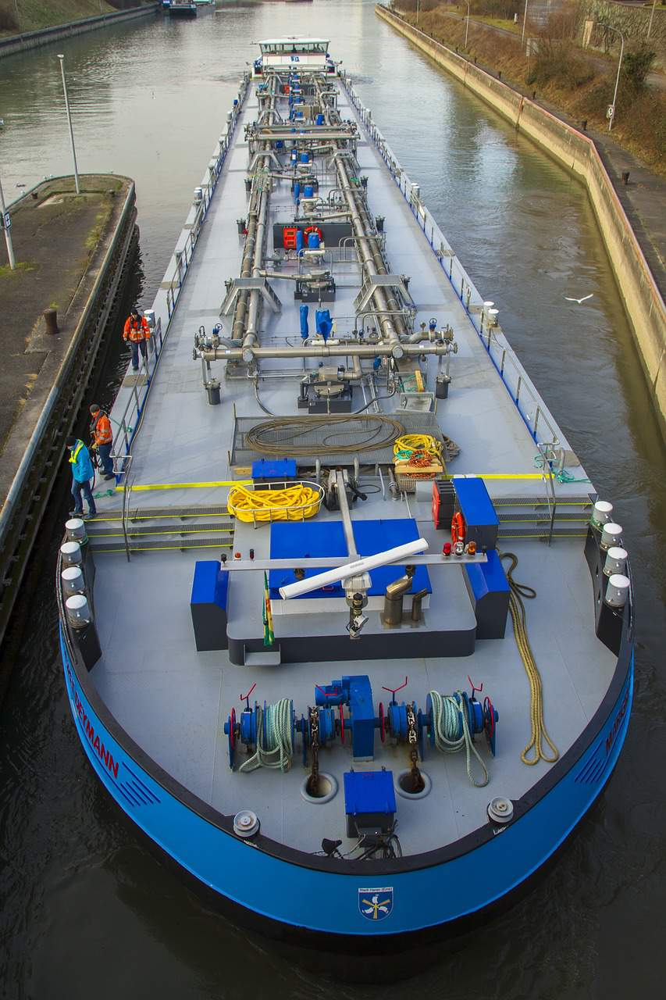

In [21]:
freight_boat = list(images_dirs.glob('freight_boat/*'))
Image.open(str(freight_boat[10]))

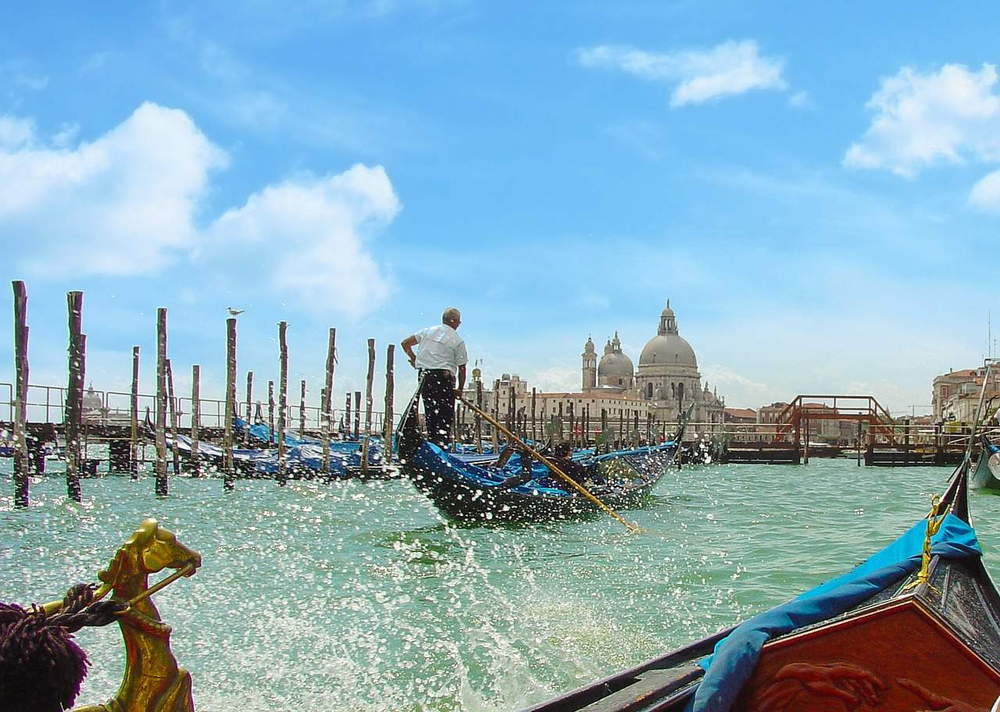

In [22]:
gondola = list(images_dirs.glob('gondola/*'))
Image.open(str(gondola[10]))

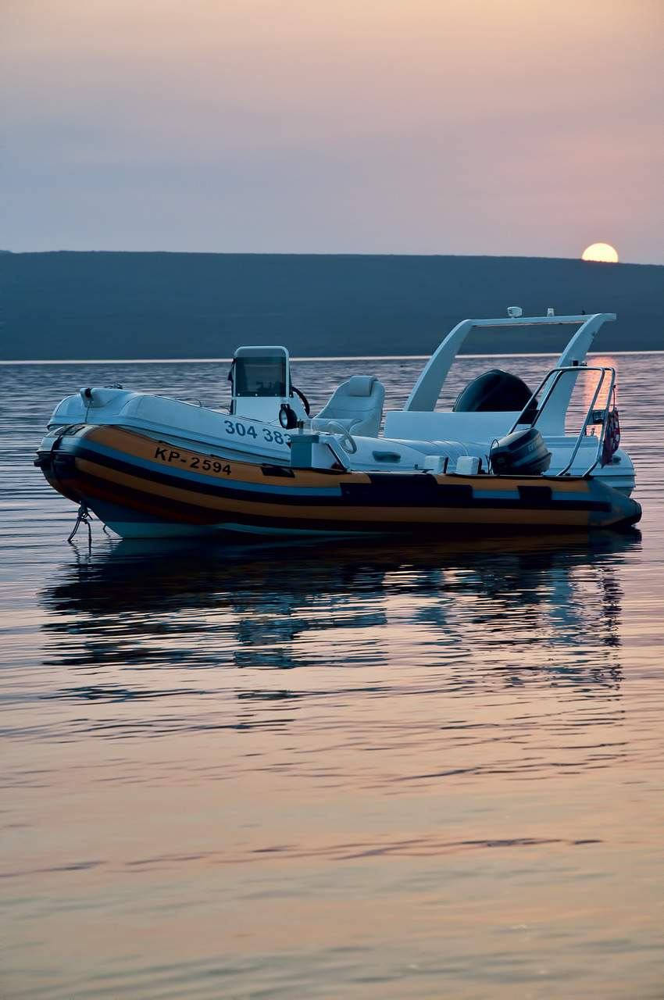

In [23]:
inflatable_boat = list(images_dirs.glob('inflatable_boat/*'))
Image.open(str(inflatable_boat[10]))

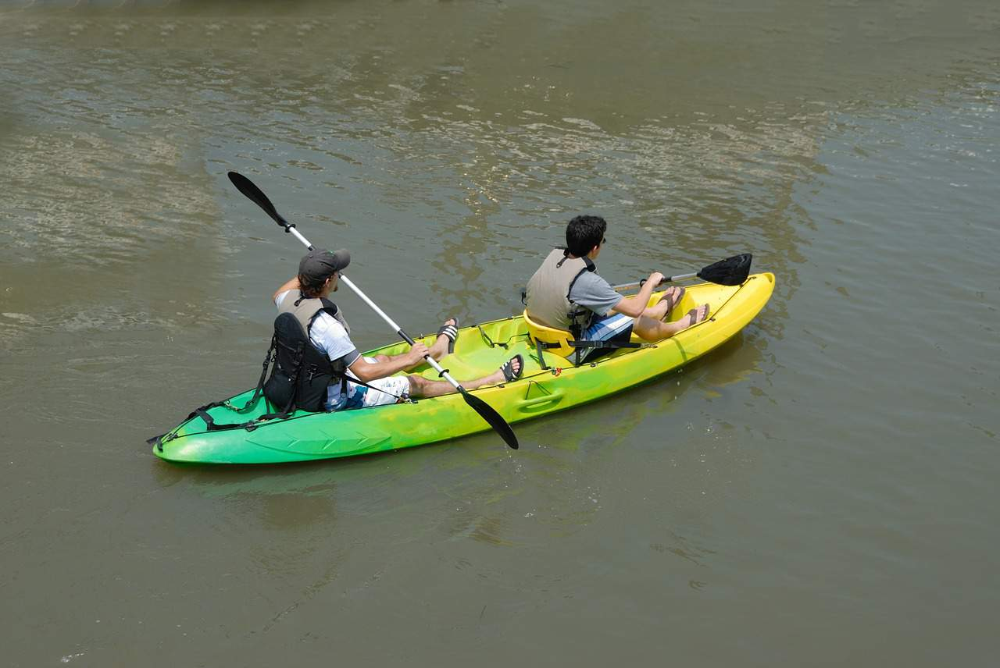

In [24]:
kayak = list(images_dirs.glob('kayak/*'))
Image.open(str(kayak[10]))

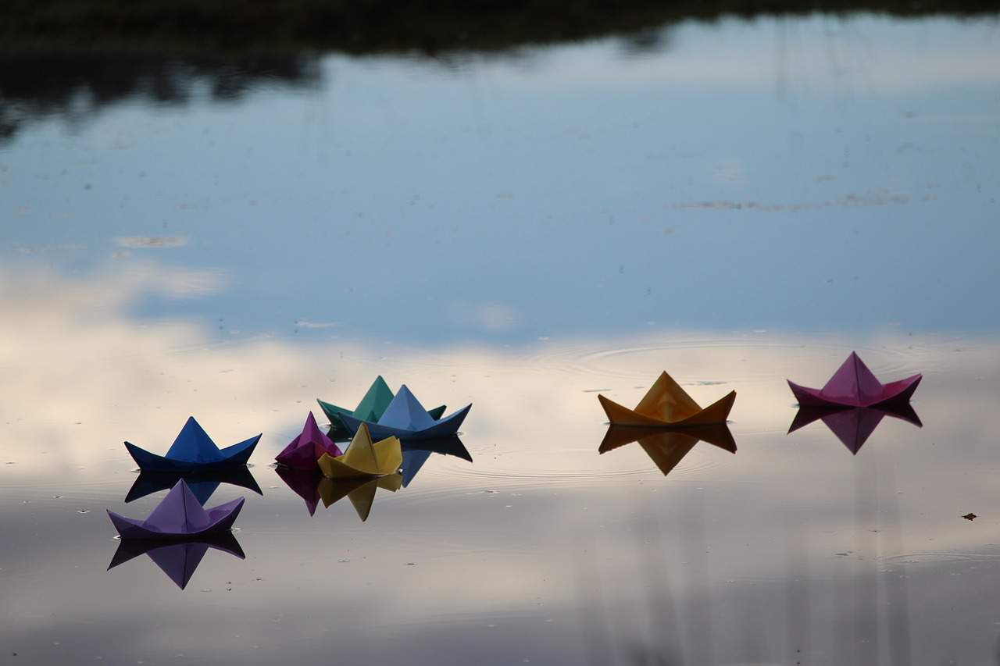

In [25]:
paper_boat = list(images_dirs.glob('paper_boat/*'))
Image.open(str(paper_boat[10]))

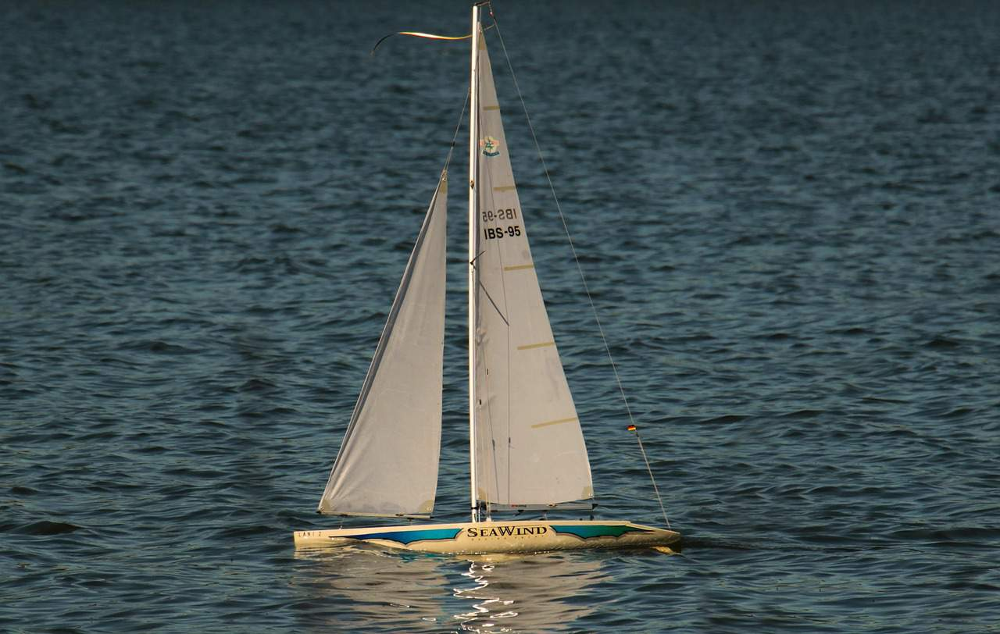

In [26]:
sailboat = list(images_dirs.glob('sailboat/*'))
Image.open(str(sailboat[10]))

Read Image

In [28]:
cv2.imread(str(buoy[12]))

array([[[233, 176, 155],
        [220, 163, 142],
        [207, 152, 131],
        ...,
        [196, 133,  73],
        [187, 124,  64],
        [181, 118,  58]],

       [[224, 167, 145],
        [217, 160, 138],
        [211, 154, 132],
        ...,
        [248, 185, 127],
        [240, 177, 119],
        [234, 171, 113]],

       [[223, 166, 140],
        [222, 167, 140],
        [223, 168, 141],
        ...,
        [255, 204, 150],
        [255, 199, 145],
        [253, 193, 139]],

       ...,

       [[122,  97,  27],
        [125, 100,  30],
        [127, 102,  32],
        ...,
        [163, 142,  61],
        [166, 145,  64],
        [169, 148,  67]],

       [[127, 102,  32],
        [130, 105,  35],
        [131, 106,  36],
        ...,
        [162, 141,  60],
        [164, 143,  62],
        [166, 145,  64]],

       [[132, 107,  37],
        [134, 109,  39],
        [135, 110,  40],
        ...,
        [160, 139,  58],
        [162, 141,  60],
        [164, 143,  62]]

In [29]:
AutoPort_images_dict = {
    'buoy': list(images_dirs.glob('buoy/*')),
    'cruise_ship': list(images_dirs.glob('cruise_ship/*')),
    'ferry_boat': list(images_dirs.glob('ferry_boat/*')),
    'freight_boat': list(images_dirs.glob('freight_boat/*')),
    'gondola': list(images_dirs.glob('gondola/*')),
    'inflatable_boat': list(images_dirs.glob('inflatable_boat/*')),
    'kayak': list(images_dirs.glob('kayak/*')),
    'paper_boat': list(images_dirs.glob('paper_boat/*')),
    'sailboat': list(images_dirs.glob('sailboat/*')),
}

In [30]:
AutoPort_labels_dict = {
    'buoy': 'buoy 0',
    'cruise_ship': 'cruise_ship 1',
    'ferry_boat': 'ferry_boat 2',
    'freight_boat': 'freight_boat 3',
    'gondola': 'gondola 4',
    'inflatable_boat': 'inflatable_boat 5',
    'kayak': 'kayak 6',
    'paper_boat': 'paper_boat 7',
    'sailboat': 'sailboat 8',
}

# Let's check shape of the input image

In [32]:
img1 = cv2.imread(str(AutoPort_images_dict['buoy'][0]))
img1.shape

(436, 530, 3)

In [33]:
img2 = cv2.imread(str(AutoPort_images_dict['cruise_ship'][0]))
img2.shape

(960, 1280, 3)

In [34]:
img3 = cv2.imread(str(AutoPort_images_dict['ferry_boat'][0]))
img3.shape

(648, 1280, 3)

In [35]:
img4 = cv2.imread(str(AutoPort_images_dict['freight_boat'][0]))
img4.shape

(853, 1280, 3)

In [36]:
img6 = cv2.imread(str(AutoPort_images_dict['gondola'][0]))
img6.shape

(960, 1280, 3)

In [37]:
img7 = cv2.imread(str(AutoPort_images_dict['inflatable_boat'][0]))
img7.shape

(960, 1280, 3)

In [38]:
img8 = cv2.imread(str(AutoPort_images_dict['kayak'][0]))
img8.shape

(796, 1280, 3)

In [39]:
img9 = cv2.imread(str(AutoPort_images_dict['paper_boat'][0]))
img9.shape

(853, 1280, 3)

In [40]:
img10 = cv2.imread(str(AutoPort_images_dict['sailboat'][0]))
img10.shape

(960, 1280, 3)

# ReSize All Image

In [41]:
X, y = [], []

for flower_name, images in AutoPort_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(299,299))
        X.append(resized_img)
        y.append(AutoPort_labels_dict[flower_name])

In [42]:
import numpy as np

X = np.array(X)
y = np.array(y)

#splitting input data into train and test set

In [43]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=43)

In [44]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [45]:
X[0].shape

(299, 299, 3)

In [46]:
X_train_scaled[0].shape

(299, 299, 3)

In [ ]:
tf.random.set_seed(1)

train_datagen = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input, \
                       rotation_range=20, \
                       width_shift_range=0.2, \
                       height_shift_range=0.2, \
                       shear_range=0.2, \
                       zoom_range=0.2, \
                       horizontal_flip=True, \
                       fill_mode='nearest')
train_generator = \
    train_datagen.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak', \
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'], \
        class_mode='categorical',\
        shuffle=True)

In [ ]:
test_datagen = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input)
test_generator = \
    test_datagen.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak', \
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'], \
        class_mode='categorical', \
        shuffle=True)

In [58]:
val_datagen = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input)
validation_generator = \
    val_datagen.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak',\
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'],\
        class_mode='categorical',\
        shuffle=True)

Found 1162 images belonging to 9 classes.


# Create object for MobileNet

In [47]:
base_model = MobileNet(weights='imagenet', include_top=False)

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [48]:
average_pooling_layer = GlobalAveragePooling2D()(base_model.output)
dropout_layer_1 = Dropout(rate=0.2)(average_pooling_layer)
hidden_layer_1 = Dense(256, activation='relu')(dropout_layer_1)
normalization_layer_1 = BatchNormalization()(hidden_layer_1)
dropout_layer_2 = Dropout(rate=0.1)(normalization_layer_1)
hidden_layer_2 = Dense(128, activation='relu')(dropout_layer_2)
normalization_layer_2 = BatchNormalization()(hidden_layer_2)
dropout_layer_3 = Dropout(rate=0.1)(normalization_layer_2)
predictions = Dense(9, activation='softmax')(dropout_layer_3)

In [49]:
model = Model(inputs=base_model.input, outputs=predictions)

In [50]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, None, None, 32)      │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, None, None, 32)      │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, None, None, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, None, None, 32)      │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, None, None, 32)      │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, None, None, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, None, None, 64)      │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, None, None, 64)      │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, None, None, 64)      │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, None, None, 64)      │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, None, None, 128)     │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, None, None, 128)     │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, None, None, 128)     │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, None, None, 128)     │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, None, None, 128)     │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,526,857 (13.45 MB)

 Trainable params: 3,504,201 (13.37 MB)

 Non-trainable params: 22,656 (88.50 KB)

In [51]:
Model: "functional_1"

In [52]:
early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)

In [55]:
weights = \
    class_weight.compute_class_weight(\
        'balanced', \
        classes=np.unique(train_generator.classes),
        y=train_generator.classes)
class_weights = dict(enumerate(weights))

In [57]:
model.compile(optimizer=Adam(learning_rate=0.0001), \
              loss='categorical_crossentropy', \
              metrics=['accuracy',Precision(),Recall()])

In [59]:
history = model.fit(train_generator, \
                    steps_per_epoch = train_generator.samples // 32, \
                    validation_data = validation_generator, \
                    validation_steps = validation_generator.samples // 32,\
                    callbacks=[early_stopping_cb],\
                    class_weight=class_weights,\
                    epochs = 50)

Epoch 1/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 356s 9s/step - accuracy: 0.1646 - loss: 2.7654 - precision: 0.1490 - recall: 0.0463 - val_accuracy: 0.3021 - val_loss: 1.8341 - val_precision: 0.5763 - val_recall: 0.0295
Epoch 2/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 25s 507ms/step - accuracy: 0.4375 - loss: 2.6257 - precision: 0.6154 - recall: 0.2500 - val_accuracy: 0.4000 - val_loss: 2.0078 - val_precision: 0.5000 - val_recall: 0.1000
Epoch 3/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 316s 9s/step - accuracy: 0.3450 - loss: 1.8113 - precision: 0.5188 - recall: 0.1899 - val_accuracy: 0.5677 - val_loss: 1.3701 - val_precision: 0.9062 - val_recall: 0.1762
Epoch 4/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.4062 - loss: 1.3855 - precision: 0.4706 - recall: 0.2500 - val_accuracy: 0.6000 - val_loss: 1.3258 - val_precision: 1.0000 - val_recall: 0.4000
Epoch 5/50
36/36 ━━━━━━━━━━━━━━━━━━━━ 272s 7s/step - accuracy: 0.4378 - loss: 1.4125 - precision: 0.6198 - recall: 0.2759 - val_accuracy: 0.6745 - val_loss: 1.112

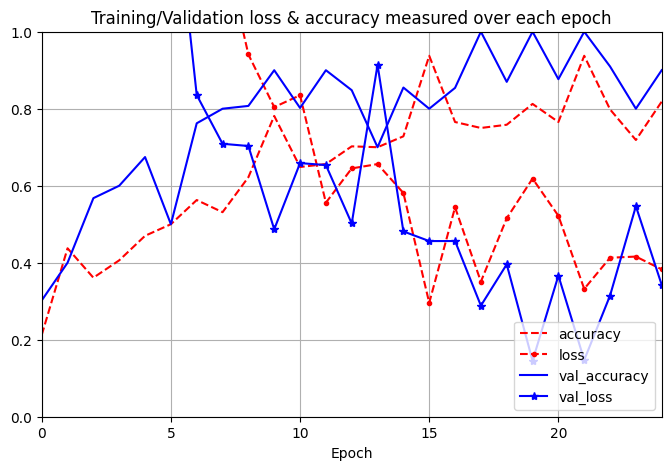

In [61]:
history_df = pd.DataFrame(history.history)
history_df.drop(['precision','recall', 'val_precision','val_recall'],\
                axis=1,inplace=True)
history_df.plot(
    figsize=(8, 5), xlim=[0, early_stopping_cb.stopped_epoch], ylim=[0, 1], \
    grid=True, xlabel="Epoch",
    style=["r--", "r--.", "b-", "b-*"])
plt.legend(loc="lower right")
plt.title('Training/Validation loss & accuracy measured over each epoch')
plt.show()

In [62]:
test_loss, test_acc, test_precision, test_recall = \
    model.evaluate(test_generator, steps=test_generator.samples // 32)
print('Metrics obtained on test images')
print(f'Accuracy: {test_acc}, Loss: {test_loss}, ' +\
      f'Precision: {test_precision}, Recall: {test_recall}')

36/36 ━━━━━━━━━━━━━━━━━━━━ 45s 1s/step - accuracy: 0.8759 - loss: 0.3633 - precision: 0.9343 - recall: 0.8406
Metrics obtained on test images
Accuracy: 0.8689236044883728, Loss: 0.3952925205230713, Precision: 0.9266862273216248, Recall: 0.8229166865348816


In [63]:
y_test_proba = model.predict(test_generator)
y_test_pred = np.argmax(y_test_proba, axis=1)

37/37 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step


In [64]:
y_test = test_generator.classes
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.04      0.05      0.04        63
           1       0.15      0.16      0.16       193
           2       0.33      0.25      0.28       389
           3       0.15      0.13      0.14       191
           4       0.12      0.13      0.13       203
           5       0.00      0.00      0.00        16
           6       0.07      0.10      0.08        31
           7       0.06      0.13      0.08        53
           8       0.00      0.00      0.00        23

    accuracy                           0.17      1162
   macro avg       0.10      0.11      0.10      1162
weighted avg       0.19      0.17      0.17      1162



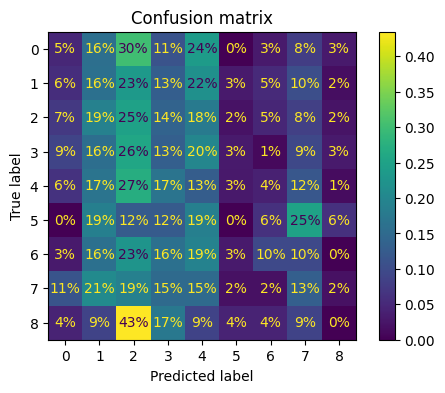

In [65]:
f, ax = plt.subplots(figsize=(6, 4))
ConfusionMatrixDisplay.from_predictions(y_test, \
                                        y_test_pred, \
                                        ax = ax, \
                                        normalize='true', \
                                        values_format='.0%')
plt.title(f'Confusion matrix')
plt.show()

In [67]:
tf.random.set_seed(43)

train_datagen_1 = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input, \
                       rotation_range=20, \
                       width_shift_range=0.2, \
                       height_shift_range=0.2, \
                       shear_range=0.2, \
                       zoom_range=0.2, \
                       horizontal_flip=True, \
                       fill_mode='nearest')
train_generator_1 = \
    train_datagen_1.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak', \
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'], \
        class_mode='categorical',\
        shuffle=True)

val_datagen_1 = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input)
validation_generator_1 = \
    val_datagen_1.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak',\
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'],\
        class_mode='categorical',\
        shuffle=True)

test_datagen_1 = \
    ImageDataGenerator(preprocessing_function = \
                       tf.keras.applications.mobilenet.preprocess_input)
test_generator_1 = \
    test_datagen_1.flow_from_directory(\
        'AutoPort',\
        target_size=(224, 224),\
        batch_size=32,\
        classes=['ferry_boat', 'gondola', 'sailboat', 'cruise_ship', 'kayak',\
                 'inflatable_boat', 'paper_boat', 'buoy', 'freight_boat'], \
        class_mode='categorical', \
        shuffle=True)

Found 1162 images belonging to 9 classes.
Found 1162 images belonging to 9 classes.
Found 1162 images belonging to 9 classes.


In [68]:
model_1 = Sequential()

# Add the first Conv2D and MaxPool2D layers
model_1.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
model_1.add(MaxPooling2D(pool_size=(2, 2)))

# Add the second Conv2D and MaxPool2D layers
model_1.add(Conv2D(32, (3, 3), activation='relu',padding='same'))
model_1.add(MaxPooling2D(pool_size=(2, 2)))

# Add the GlobalAveragePooling2D layer
model_1.add(GlobalAveragePooling2D())

# Add the first Dense layer
model_1.add(Dense(128, activation='relu'))

# Add the second Dense layer
model_1.add(Dense(128, activation='relu'))

# Add the output layer
model_1.add(Dense(9, activation='softmax'))

In [69]:
model_1.summary()
Model: "sequential"

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 111, 111, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 55, 55, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 32)                  │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │           4,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 32,041 (125.16 KB)

 Trainable params: 32,041 (125.16 KB)

 Non-trainable params: 0 (0.00 B)

In [70]:
early_stopping_cb_1 = EarlyStopping(patience=5, restore_best_weights=True)

In [71]:
weights1 = \
    class_weight.compute_class_weight('balanced',\
                                      classes=\
                                      np.unique(train_generator_1.classes), \
                                      y=train_generator_1.classes)
class_weights1 = dict(enumerate(weights1))

In [72]:
model_1.compile(optimizer=Adam(learning_rate=0.0001), \
                loss='categorical_crossentropy', \
                metrics=['accuracy',Precision(),Recall()])

In [73]:
history_1 = model_1.fit(train_generator_1, \
                        steps_per_epoch = train_generator_1.samples // 32, \
                        validation_data = validation_generator_1, \
                        validation_steps = \
                            validation_generator_1.samples // 32, \
                        callbacks=[early_stopping_cb_1], \
                        class_weight=class_weights1 , \
                        epochs = 20)

Epoch 1/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 112s 3s/step - accuracy: 0.1440 - loss: 2.1713 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00 - val_accuracy: 0.1033 - val_loss: 2.1830 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 2/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.0312 - loss: 2.7407 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00 - val_accuracy: 0.1000 - val_loss: 2.1832 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 3/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 131s 3s/step - accuracy: 0.0936 - loss: 2.1194 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00 - val_accuracy: 0.0885 - val_loss: 2.1767 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 4/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.1562 - loss: 1.9492 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00 - val_accuracy: 0.1000 - val_loss: 2.1575 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00
Epoch 5/20
36/36 ━━━━━━━━━━━━━━━━━━━━ 101s 3s/step - accuracy: 0.0840 

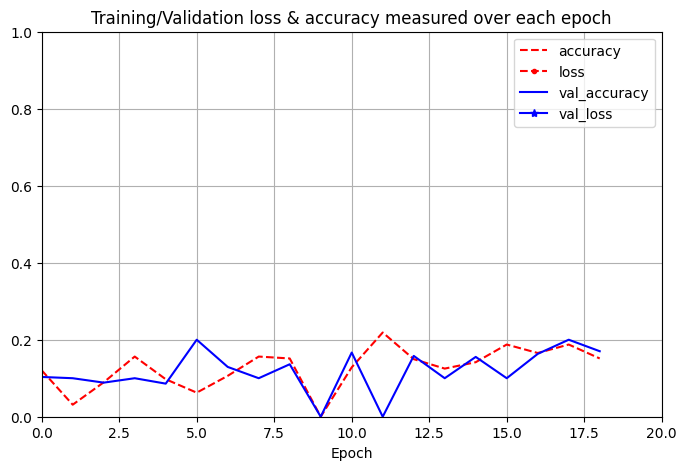

In [74]:
history_df1 = pd.DataFrame(history_1.history)
history_df1.drop(['precision_1','recall_1', 'val_precision_1','val_recall_1'],\
                 axis=1,inplace=True)
history_df1.plot(
    figsize=(8, 5), xlim=[0, 20], ylim=[0, 1], grid=True, xlabel="Epoch",
    style=["r--", "r--.", "b-", "b-*"])
plt.legend(loc="upper right")
plt.title('Training/Validation loss & accuracy measured over each epoch')
plt.show()

In [75]:
test_loss1, test_acc1, test_precision1, test_recall1 = \
    model_1.evaluate(test_generator_1, steps=test_generator_1.samples // 32)
print('Metrics obtained on test images')
print(f'Accuracy: {test_acc1}, Loss: {test_loss1}, ' +\
      f'Precision: {test_precision1}, Recall: {test_recall1}')

36/36 ━━━━━━━━━━━━━━━━━━━━ 24s 653ms/step - accuracy: 0.1530 - loss: 2.1301 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00
Metrics obtained on test images
Accuracy: 0.1588541716337204, Loss: 2.1289491653442383, Precision: 0.0, Recall: 0.0


In [76]:
y_test_proba1 = model_1.predict(test_generator_1)
y_test_pred1 = np.argmax(y_test_proba1, axis=1)

37/37 ━━━━━━━━━━━━━━━━━━━━ 25s 662ms/step


In [77]:
y_test1 = test_generator_1.classes
print(classification_report(y_test1, y_test_pred1))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        63
           1       0.16      0.56      0.26       193
           2       0.40      0.01      0.01       389
           3       0.00      0.00      0.00       191
           4       0.00      0.00      0.00       203
           5       0.00      0.00      0.00        16
           6       0.03      0.42      0.05        31
           7       0.00      0.00      0.00        53
           8       0.00      0.00      0.00        23

    accuracy                           0.11      1162
   macro avg       0.07      0.11      0.03      1162
weighted avg       0.16      0.11      0.05      1162



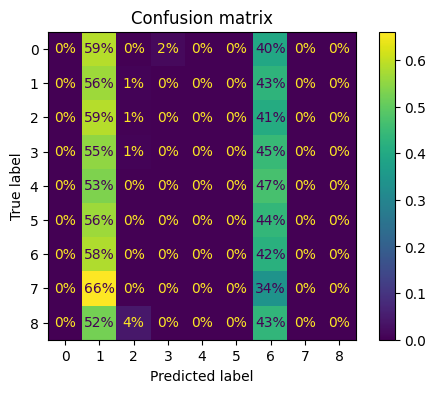

In [78]:
f, ax = plt.subplots(figsize=(6, 4))
ConfusionMatrixDisplay.from_predictions(y_test1, \
                                        y_test_pred1, \
                                        ax = ax, \
                                        normalize='true', \
                                        values_format='.0%')
plt.title(f'Confusion matrix')
plt.show()

# Conclusions

We created two models.

A model baased on MobileNet with top layers replaced
A full custom model
 The accuracy obtained with a full custom model is much lower than that obtained with MobileNet pre-trained model. For automating port operations, the MobileNet custom model can be used and produces much better results.